# **Maestría en Inteligencia Artificial Aplicada**
## **Curso: Inteligencia Artificial y Aprendizaje Automático**
#### Tecnológico de Monterrey
#### Prof Luis Eduardo Falcón Morales

### **Semana: Autoencoders y Técnicas de Conglomerados (Clustering)**

**Nombre y matrícula:**

**Martin Jurado Pedroza**   **A01795568**

# **Introducción**

#### Sabemos que kMeans es un método de clasificación (clustering) no supervisado que nos ayuda a encontrar subgrupos de datos similares dentro de un conjunto de datos. Veamos ahora el efecto que puedan tener diferentes técnicas de reducción de dimensionalidad, Autoencoders y PCA, en la calidad de dichos subgrupos.

La página inicial de Kaggle de donde proceden dichos datos se desactualizó, pero mientras la acutalizan, el archivo de los datos estará en Canvas.

El archivo consta de 15,000 registros con 9 factores para un problema de ambiente de trabajo en una organización (entre ellos el problema de rotación de personal como ya estudiamos en semanas anteriores) con variables numéricas y categóricas.

La idea es usar técnicas de Autoencoders y PCA, en combinación con el método de KMeans, para encontrar subgrupos o cúmulos de personas que nos den información sobre el ambiente de trabajo dentro de dicha organización.

Las técnicas que aplicaremos son técnicas no supervisadas, ya que no tenemos la información en relación a un problema de clasificación o regresión.



Así, usaremos técnicas de reducción de dimensionalidad para identificar subgrupos similares de empleados a través de información proporcionada por el archivo proveniente de recursos humanos. Primero vamos a identificar los subgrupos y después vamos predecir qué datos están en cada subgrupo.

Para entender lo que nos dicen dichos subgrupos desde un punto de vista de negocio, necesitamos analizar dichos subrupos con respecto a los factores iniciales. Es decir, ¿qué tienen en común los empleados que están en un mismo subgrupo?

Recuerda que la manera en que funciona el método del codo (elbow method) para seleccionar el mejor número de subrupos en la técnica de kMeans, es buscando la cantidad de cúmulos que nos lleve a la suma más baja de distancias al cuadrado (llamada "inercia"), es decir, donde la inercia no sufra cambios importantes al seguir aumentando la cantidad de cúmulos.


In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

import tensorflow as tf
from keras.layers import Input, Dense
from keras.models import Model, load_model

from keras.optimizers import SGD

from sklearn.preprocessing import OrdinalEncoder

# comentemos por el momento los posibles Warnings:
from warnings import filterwarnings
filterwarnings('ignore')

2024-06-17 19:12:38.386926: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# **Funciones para gráficas de la última parte de esta atcividad.**

In [17]:
# Esta celda contiene las funciones para generar varios de los
# gráficos que requeriremos en esta actividad.

# Definimos la función de gráficos con datos numéricos:

def mi_scatterplotPCAEncoder(perfil_Zencoder, perfil_pca, fact1, fact2):

  plt.figure(figsize=(15,10))
  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))

  sns.scatterplot(data=perfil_Zencoder,
                  x= fact1,
                  y= fact2,
                  hue='autoencoder_clusters',
                  s=85,
                  alpha=0.4,
                  palette='bright',
                  ax=ax1
                  ).set_title('(AutoEncoder) Cúmulos',fontsize=18)

  sns.scatterplot(data=perfil_pca,
                  x=fact1,
                  y=fact2,
                  hue='pca_clusters',
                  s=85,
                  alpha=0.6,
                  palette='bright'
                  ).set_title('(PCA) Cúmulos',fontsize=18)



# Definimos la función de gráficos con variables categóricas:

def mi_catplotPCAEncoder(perfil_Zencoder, perfil_pca, fact1, fact2):

  plt.figure(figsize=(15,10))
  fig = plt.subplots(1,2, figsize=(20,15))

  ax1 = sns.catplot(data=perfil_Zencoder,
                    x= fact1,
                    y= fact2,
                    hue='autoencoder_clusters',
                    jitter=0.6,
                    s=20,
                    alpha=0.6,
                    palette='bright',
                    legend_out=True
                    )

  ax2 = sns.catplot(data=perfil_pca,
                    x=fact1,
                    y=fact2,
                    hue='pca_clusters',
                    jitter=0.6,
                    s=20,
                    alpha=0.6,
                    palette='bright',
                    legend_out=True
                    )

  ax1.fig.suptitle('(AutoEncoder) Cúmulos', fontsize=16,)
  ax2.fig.suptitle('(PCA) Cúmulos', fontsize=16)
  plt.close(1)
  plt.close(2)

# **Cargando la información**

In [18]:
# Cargamos los datos:

data = pd.read_csv("data/hr_autoencoders.csv",sep=',',header='infer')
print(data.shape)
data.head().T

(15000, 9)


,0,1,2,3,4
satisfaction_level,0.09,0.38,0.8,0.11,0.72
last_evaluation,0.36,0.53,0.86,0.88,0.87
number_project,2,2,5,7,5
average_montly_hours,96,157,262,272,223
time_spend_company,2,3,6,4,5
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


La información sobre cada variable es la siguiente:

*   #### **satisfaction_level:** Nivel de satisfacción del empleado dentro de la organización en la última encuesta realizda. Escala de 0 a 1, donde 1 es lo mejor.

*   #### **last_evaluation:** Calificación del desempeño del empleado en la última evaluación realizada por la empresa. Escala de 0 a 1, donde 1 es lo mejor.

*   #### **number_project:** Número promedio de proyectos en los que usualmente está involucrado dentro de la empresa.

*   #### **average_montly_hours:** Horas mensuales promedio de trabajo en la empresa.

*   #### **time_spend_company:** Cantidad de años dentro de la empresa.

*   #### **Work_accident:** Si ha tenido (1) o no (0) un accidente dentro de la empresa.

*   #### **promotion_last_5years:** Si ha sido promovido (1) o no (0) dentro de la empresa en los últimos 5 años.

*   #### **sales:** Área a la que pertenece dentro de la empresa: sales, technical, support, IT, product_mng, marketing, RandD, accounting, hr, management.

*   #### **salary:** Nivel de salario del empleado: low, medium, high.

In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     15000 non-null  float64
 1   last_evaluation        15000 non-null  float64
 2   number_project         15000 non-null  int64  
 3   average_montly_hours   15000 non-null  int64  
 4   time_spend_company     15000 non-null  int64  
 5   Work_accident          15000 non-null  int64  
 6   promotion_last_5years  15000 non-null  int64  
 7   sales                  15000 non-null  object 
 8   salary                 15000 non-null  object 
dtypes: float64(2), int64(5), object(2)
memory usage: 1.0+ MB


Las variables numéricas son: satisfaction_level, last_evaluation, number_project, average_montly_hours, time_spend_company.

Las variables categóricas binarias son: Work_accident, promotion_last_5years.

Varaible categórica nominal: sales.

Variable categórica ordinal: salary.

#### **Apliquemos las transformaciones correspondientes a cada una de estas variables**

In [20]:
num_list = ['satisfaction_level', 'last_evaluation', 'number_project',
           'average_montly_hours', 'time_spend_company']   # [0,1,2,3,4]

cat_list = ['Work_accident','promotion_last_5years','sales','salary']   # [5,6,7,8]

dftodos = data[num_list + cat_list]
print(dftodos.shape)
dftodos.head().T

(15000, 9)


,0,1,2,3,4
satisfaction_level,0.09,0.38,0.8,0.11,0.72
last_evaluation,0.36,0.53,0.86,0.88,0.87
number_project,2,2,5,7,5
average_montly_hours,96,157,262,272,223
time_spend_company,2,3,6,4,5
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


In [21]:
# Escalamos las variables numéricas antes de aplicar KMeans,
# ya que este es muy sensible a la escala:

X_Tnum = dftodos.copy()

scaler = StandardScaler()
scaler.fit(dftodos[num_list])
X_Tnum[num_list] = scaler.transform(dftodos[num_list])

df_Tnum = pd.DataFrame(X_Tnum, columns=dftodos.columns)

df_Tnum.head().T

,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


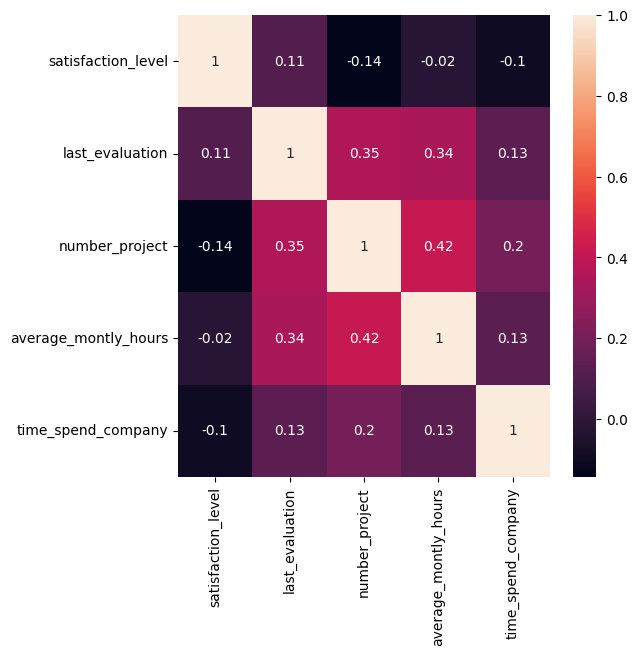

In [22]:
# La matriz de correlación de las varaibles numéricas nos indica que no se
# observan correlaciones altas entre ellas, es decir, se tiene una
# multicolinealidad baja:

correlations = df_Tnum[num_list].corr()
f, ax = plt.subplots(figsize = (6,6))
sns.heatmap(correlations, annot = True);

# **KPrototype : KMeans para variables numéricas y categóricas.**



#### **Recordemos que KMeans es una técnica para variables numéricas ya que está basada en la distancia (por ejemplo, euclideana) entre puntos. Para el caso de variables categóricas, dicha "distancia" será ahora la Moda y la similitud será la diferencia entre los distintos niveles.**

#### **Para ello debemos usar la librería KModes para datos solamente categóricos, o bien KPrototype, para conjunto de datos mixtos (numéricos y categóricos).**

#### **Toma en cuenta que debido al proceso de estar manejando variables numéricas y categóricas, el método de KPrototype puede tomar varios minutos en terminarse.**

In [23]:
from kmodes.kprototypes import KPrototypes

In [24]:
df_Tnum.head().T

,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low


Vemos la información de las variables categóricas:

In [25]:
df_Tnum['Work_accident'].value_counts()

Work_accident
0    12831
1     2169
Name: count, dtype: int64

In [26]:
df_Tnum['promotion_last_5years'].value_counts()

promotion_last_5years
0    14681
1      319
Name: count, dtype: int64

In [27]:
df_Tnum['sales'].value_counts()

sales
sales          4141
technical      2720
support        2229
IT             1227
product_mng     902
marketing       858
RandD           787
accounting      767
hr              739
management      630
Name: count, dtype: int64

In [28]:
df_Tnum['salary'].value_counts()

salary
low       7317
medium    6446
high      1237
Name: count, dtype: int64

#### **Método de inicialización de KModes y KPrototype:**

Existen varias técnicas de inicialización de las variables catagóricas, en particular usaremos la llamada "Huang", la cual selecciona los primeros "K" registros distintos para iniciar con "K-Modes". Recordemos que en KModes se utuliza la moda en lugar del promedio aritmético que se aplica en las numéricas.

La "distancia" o "diferencia" entre un dato y un centroide será la suma de la diferencia de la parte numérica más la parte categórica. La parte numérica se calcula con la distancia euclideana usual sobre las coordenadas numéricas. Y la parte categórica mide la distancia de un dato a un centroide, como la cantidad de coordenadas categóricas diferentes dentre el dato y el centroide.

Las variables categóricas no requieren ser transformadas, solamente hay que indicar cuáles son y el algoritmo se encargará de tratarlas como tales.

Puedes consultar la siguiente liga de la documentación:

https://kprototypes.readthedocs.io/en/latest/api.html

Text(0, 0.5, 'Inercia')

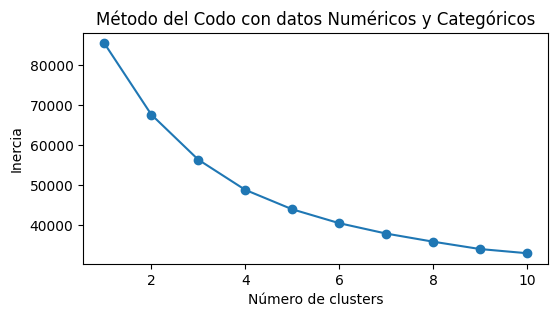

In [29]:
# Apliquemos el método de KMeans para datos mixtos (numéricos y categóricos)

#                                                            ...esta celda tarda 45 mins aprox en Google-Colab ...

ssecat = []    # Suma del cuadrado de los errores numéricos y categóricos .

k_list = range(1, 11)

cat_cols = [5,6,7,8]  # cat_list

for k in k_list:
    kp = KPrototypes(n_clusters=k, init='Huang', n_init=5)    # Inicializamos KMeans-con-varaibles-Mixtas
    kp.fit(df_Tnum , categorical=cat_cols)     # debemos indicarle cuáles son las variables categóricas.
    ssecat.append([k, kp.cost_])   # Calculamos la incercia de cada dato, numérica y categórica conjunta.


oca_results_scale = pd.DataFrame({'Cluster': range(1,11), 'SSE-CAT': ssecat})

plt.figure(figsize=(6,3))
plt.plot(pd.DataFrame(ssecat)[0], pd.DataFrame(ssecat)[1], marker='o')
plt.title('Método del Codo con datos Numéricos y Categóricos')
plt.xlabel('Número de clusters')
plt.ylabel('Inercia')

# **Ejercicio - 1:**

In [30]:
# Selecciona el valor del entero "k" de kMeans, la cantidad de subgrupos o
# cúmulos (clusters) que creas adecuado siguiendo la técnica del codo
# y de acuerdo a la gráfica obtenida en la celda anterior:


k_clusters_KProto = 5


**Selección de K**
El gráfico del método del codo muestra la inercia (o WCSS) frente al número de cúmulos. El punto donde la disminución de la inercia se vuelve menos pronunciada es conocido como el "codo". Según el gráfico, este punto se encuentra alrededor de 5 clusters. A partir de este punto, la reducción adicional en la inercia es menor, lo que indica que añadir más cúmulos no mejora significativamente la agrupación de los datos.

Recordemos que el Autoencoder es una red neuronal artificial, por lo que ahora sí requerimos transformar también las variables categóricas.

In [31]:
# Escalando la variable Ordinal:

df_Tnumord = df_Tnum.copy()

ordenc = OrdinalEncoder()
df_Tnumord[['salary']] = ordenc.fit_transform(df_Tnumord[['salary']])

df_Tnumord.head().T

,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,1.0,1.0,2.0,2.0,1.0


Las variables binarias las dejaremos como tales y la nominal aplicaremos one-hot-encoding con el método get_dummies() de Pandas:

In [32]:
X_Tnumordnom = df_Tnumord.copy()   # transformemos la variable Nominal con las Dummies de Pandas.

X_Tnumordnom = pd.get_dummies(X_Tnumordnom, columns=['sales'], drop_first=True)

df_Tnumordnom = pd.DataFrame(X_Tnumordnom)

print(df_Tnumordnom.shape)
df_Tnumordnom.head().T

(15000, 17)


,0,1,2,3,4
satisfaction_level,-2.102542,-0.936248,0.752869,-2.022108,0.431132
last_evaluation,-2.080109,-1.087016,0.840752,0.957587,0.89917
number_project,-1.46271,-1.46271,0.971174,2.593762,0.971174
average_montly_hours,-2.10309,-0.881799,1.220424,1.420635,0.439598
time_spend_company,-1.026055,-0.341166,1.713502,0.343723,1.028612
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
salary,1.0,1.0,2.0,2.0,1.0
sales_RandD,False,False,False,False,False
sales_accounting,False,False,False,False,False


# **Modelo AUTOENCODER**

In [33]:
# Definamos una arquitectura Autoencoder de manera usual para el caso de
# búsqueda de conglomerados: iniciar en el Encoder incrementando las primeras
# capas densas ocultas para deshacer lo mayor posible la dependencia de los
# factores, para posteriormente proyectarlos al espacio latente Z de menor
# dimensión. Cuando decimos de menor dimensión, es con respecto a la dimensión
# de los factores de entrada. En particular usaremos aproximadamente la mitad
# de los nodos/factores de entrada (que son 17).
# Posteriormente el Decoder será un espejo del
# Encoder, salvo alguna capa que podemos eliminar para que no se tenga una
# simetría completa y obtengamos algo más que simplemente vectores muy
# similares a los iniciales de entrada.
# Cada capa densa la inicializamos con Xavier-Glorot y usamos ReLU como
# función de activación.
# Finalmente usamos Adam como optimizador y la suma de cuadrados para la
# función de costo.

input_factors = df_Tnumordnom.shape[1]  # cantidad de factores en los datos de entrada.
int_z_latent = 8     # Dimensión del espacio latente Z.
encoding_dim = k_clusters_KProto  # valor k que determinaste en el método del codo del Ejercicio 1.

input_df = Input(shape=(input_factors, ))

# Capas del ENCODER:
x = Dense(encoding_dim, activation='relu')(input_df)
x = Dense(400, activation='relu', kernel_initializer='glorot_uniform')(x)
x = Dense(400, activation='relu', kernel_initializer='glorot_uniform')(x)
x = Dense(1500, activation='relu', kernel_initializer='glorot_uniform')(x)

# ESPACIO LATENTE Z:
encoded = Dense(int_z_latent, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)

# Capas del DECODER:
x = Dense(1500, activation = 'relu', kernel_initializer = 'glorot_uniform')(encoded)
x = Dense(400, activation = 'relu', kernel_initializer = 'glorot_uniform')(x)

decoded = Dense( input_factors, kernel_initializer = 'glorot_uniform')(x)

# Generamos los modelos Autoencoder y Encoder:
autoencoder = Model(input_df, decoded)  # Modelo Autoencoder: (entrada de datos iniciales) + (Encoder) + (espacio-Z-latente) + (Decoder).
encoder = Model(input_df, encoded)      # Modelo Encoder:  (entrada de datos iniciales) + (Encoder) + (espacio-Z-latente).

autoencoder.compile(optimizer = 'adam', loss = 'mean_squared_error')

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Pasamos al proceso de entrenamiento del Autoencoder.
# Aunque solo requeriremos en este ejercicio el Encoder, en el proceso debemos
# también generar el Decoder:

autoencoder.fit(df_Tnumordnom, df_Tnumordnom, batch_size=256, epochs = 30, verbose = 1)


Epoch 1/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.3093
Epoch 2/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.1702
Epoch 3/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.1398
Epoch 4/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.1259
Epoch 5/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.1144
Epoch 6/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.1050
Epoch 7/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0986
Epoch 8/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0947
Epoch 9/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0899
Epoch 10/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0870
Epoch 11/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0844
Epoch 12/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0829
Epoch 13/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0814
Epoch 14/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0802
Epoch 15/30
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0791
Epoc

In [34]:
pred_Z_latente = encoder.predict(df_Tnumordnom)   # generamos los vectores en el espacio latente Z a la salida del Encoder.

469/469 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [35]:
pred_Z_latente.shape   # dimensión de los vectores en el espacio latente

(15000, 8)

Ahora, con base a los vectores latentes obtenidos con el Autoencoder, apliquemos kMeans (con el método usual para variables numéricas) para seleccionar cuántos cúmulos podríamos generar con estos vectores para obtener información sobre los empleados de la empresa y su potencial salida de la misma.

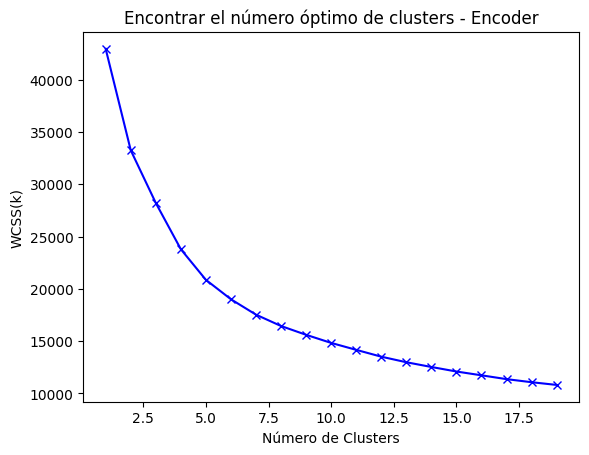

In [36]:
scores_Z = []                                          #    tarda menos de 1 min

range_values = range(1,20)

for i in range_values:
    kmeans = KMeans(n_clusters = i, n_init=10)
    kmeans.fit(pred_Z_latente)
    scores_Z.append(kmeans.inertia_)   # WCSS : within-cluster sum of square


plt.plot(range_values, scores_Z, 'bx-')
plt.title("Encontrar el número óptimo de clusters - Encoder")
plt.xlabel("Número de Clusters")
plt.ylabel("WCSS(k)")
plt.show()

Basándonos en el método del codo, podríamos decir que 5, 6 o 7 cúmulos serían adecuados.

Veamos que valor de K obtenemos con la técnica Silhouette.

Si no conoces esta técnica, puedes consultar la documentación correspondiente en la siguiente liga:

https://www.scikit-yb.org/en/latest/api/cluster/silhouette.html


In [39]:
from yellowbrick.cluster import SilhouetteVisualizer

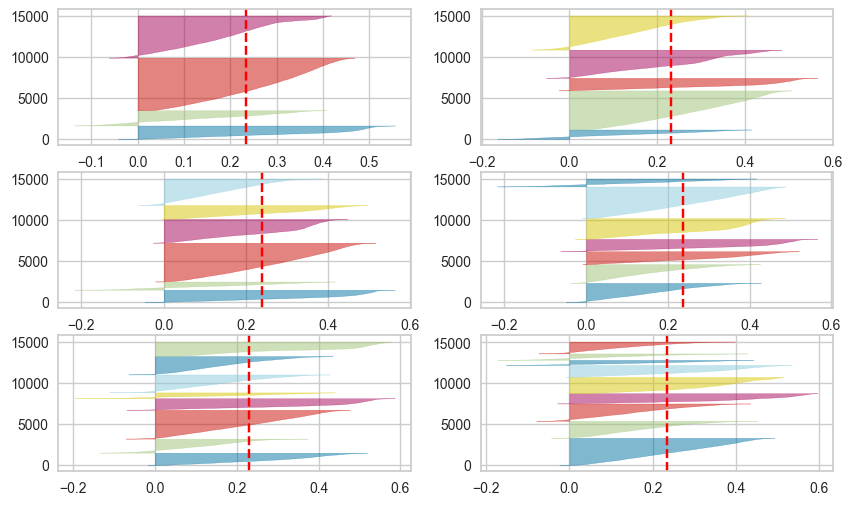

In [40]:
fig, ax = plt.subplots(3, 2, figsize=(10,6))            # tarda se 1 a 2 mins

for i in [4,5,6,7,8,9]:
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=7)
    q, mod = divmod(i-2, 2)

    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(pred_Z_latente)

# **Ejercicio - 2:**

In [41]:
# Selecciona el valor del entero "k" del número de cúmulos con base a lo
# observado los gráficoa de la técnica del codo y de silhouette.
# Observa que no necesriamente deben coincidir los valores observados
# por ambos métodos, por lo que deberás elegir el que consideres
# más adecuado:



k_clusters_Z_latente = 5





**Selección de K**
La técnica de silhouette proporciona una medida de cuán similar es un objeto a su propio cúmulo en comparación con otros cúmulos. Se realizaron análisis para 4, 5, 6, 7, 8 y 9 cúmulos. Los resultados indicaron que 5 cúmulos presentan una buena separación y cohesión, con valores de silhouette más altos que los otros valores probados, lo que sugiere que esta cantidad de cúmulos logra un balance adecuado entre cohesión intra-cúmulo y separación inter-cúmulo.

In [42]:
km_Z_latent = KMeans(n_clusters= k_clusters_Z_latente,    # valor que seleccionaste en el Ejercicio 2.
                     n_init=10,    # número de veces que selecciona vectores de inicialización y se queda con el de menor inercia.
                     max_iter=500,
                     init='k-means++').fit(pred_Z_latente)

labels_Z_latent = km_Z_latent.labels_    # etiquetas para cada registro-renglón de los datos de entrada.

In [43]:
pd.DataFrame(labels_Z_latent).value_counts()   # Tamaño de los clusters obtenidos con el método del Autoencoder.

0
0    4756
2    4144
1    3434
4    1526
3    1140
Name: count, dtype: int64

In [44]:
# Apliquemos PCA ahora a los vectores latentes obtenidos para proyectarlos y
# visualizarlos en un espacio de dimensión 2:

pca = PCA(n_components=2)
princ_comp = pca.fit_transform(pred_Z_latente)
pca_df = pd.DataFrame(data = princ_comp, columns=["pca1", "pca2"])
pca_df = pd.concat([pca_df, pd.DataFrame({"cluster":labels_Z_latent})], axis = 1)
pca_df.head(3)

,pca1,pca2,cluster
0,0.383015,-2.596551,1
1,-0.441300,-1.238742,1
2,1.516294,1.377345,3


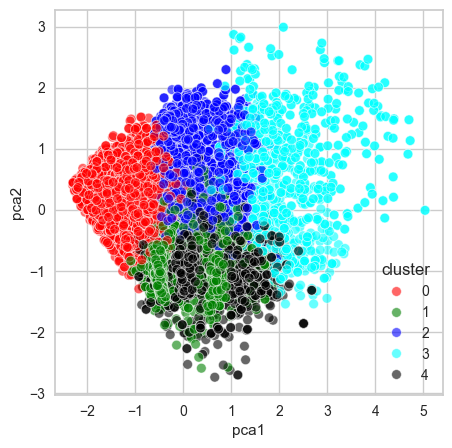

In [45]:
plt.figure(figsize=(5,5))
ax = sns.scatterplot(x="pca1", y = "pca2", hue="cluster", data = pca_df,
                     alpha=0.6,
                     palette=["red", "green", "blue","cyan", "black",'pink','orange', "yellow"])
plt.show()

In [46]:
# Concatenamos la información de las etiquetas de cada registro del dataframe de
# entrada indicando además en qué cúmulo se encuentran.
# Es importante tener los valores iniciales sin transformar con la información
# de a qué cumulo pertenece para poder darles un mejor significado desde el
# punto de vista del negocio, en este caso sobre cada factor y su impacto en
# la posible salida de un empleado.

cluster_Z_latent_perfiles = pd.concat([dftodos, pd.DataFrame({'autoencoder_clusters':labels_Z_latent})], axis=1 )

cluster_Z_latent_perfiles.head().T

,0,1,2,3,4
satisfaction_level,0.09,0.38,0.8,0.11,0.72
last_evaluation,0.36,0.53,0.86,0.88,0.87
number_project,2,2,5,7,5
average_montly_hours,96,157,262,272,223
time_spend_company,2,3,6,4,5
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low
autoencoder_clusters,1,1,3,4,2


# **PCA - Análisis de Componentes Principales**



Aplicaremos ahora la técnica PCA a los datos iniciales para generar igualmente cúmulos y compararlo con lo obtenido con la técnica de Autoencoder previamente vista. Esta técnica es más conocida y generalemente la que se aplica en primera instancia en un problema de agrupamiento (clustering).

En este caso lo haremos tomando directamente las decisiones sobre los gráficos que estarmos generando:

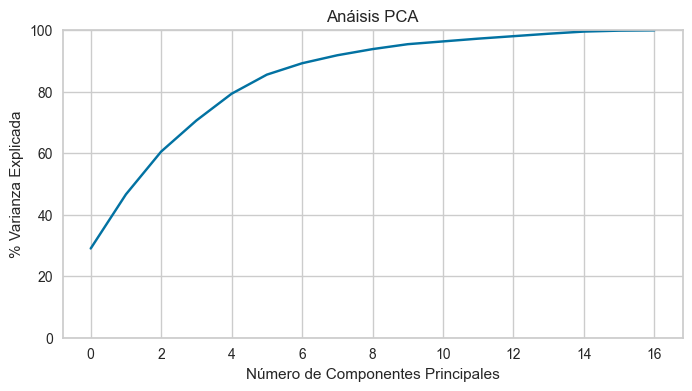

In [47]:
# Consideremos el DataFrame con los 17 vectores transformados
# y apliquemos PCA con todos ellos para ver qué cantidad de
# componenes principales podrían ser suficientes para un análisis
# de relación factores y cúmulos que formaremos:

pca = PCA(n_components= df_Tnumordnom.shape[1], random_state=5)
pca.fit(df_Tnumordnom)

variance = pca.explained_variance_ratio_
var = np.cumsum(np.round(variance, 3)*100)

plt.figure(figsize=(8,4))
plt.ylabel('% Varianza Explicada')
plt.xlabel('Número de Componentes Principales')
plt.title('Anáisis PCA')
plt.ylim(0,100.1)
plt.plot(var);

#### **Vemos que con 4 o 6 componentes principales se explica aproximadamente entre el 80% y 90% de su varianza.**

#### **Selecconaremos el valor de 6 componentes principales (que implica cerca del 90% de la variabilidad de los datos) para fines de este ejercicio y a continuación veamos cuántos cúmulos podrían ser adecuados usar al aplicar el método de conglomerados (clustering).**

Text(0, 0.5, 'Inercia')

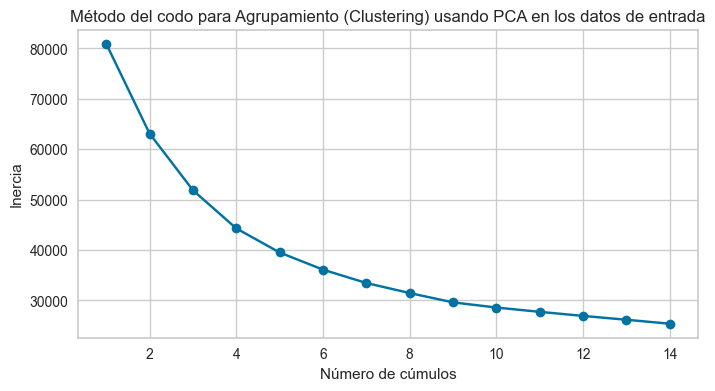

In [48]:
                                                            #  tarda menos de 1 min
pca = PCA(n_components=6)    # seleccionamos 6 componentes principales que tienen un 90% de la varibilidad total
pca_T = pca.fit_transform(df_Tnumordnom)
pca_df_T = pd.DataFrame(pca_T, columns=['pc1','pc2','pc3','pc4','pc5','pc6'])


sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k,n_init=7,random_state=7)
    km.fit(pca_df_T)
    sse.append([k, km.inertia_])

pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(8,4))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Método del codo para Agrupamiento (Clustering) usando PCA en los datos de entrada')
plt.xlabel('Número de cúmulos')
plt.ylabel('Inercia')

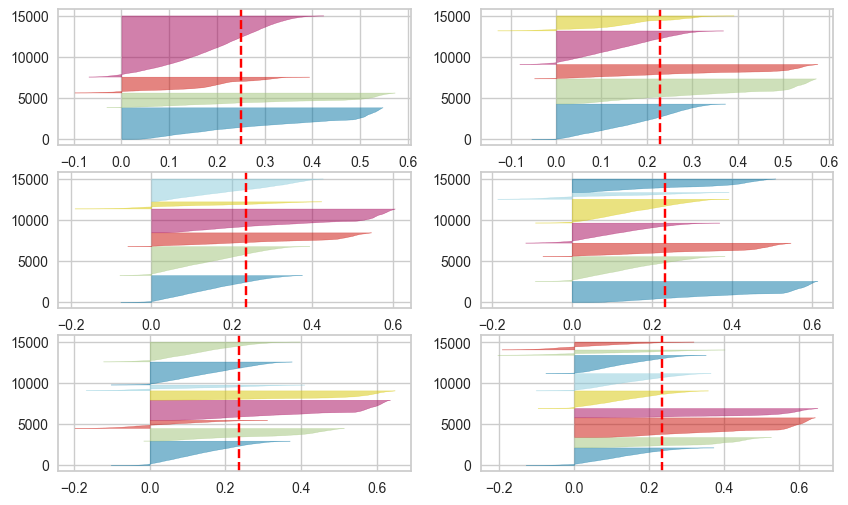

In [49]:
# Veamos también el método Silhouette a ver que nos dice:

fig, ax = plt.subplots(3, 2, figsize=(10,6))                            # tarda como 1 min

for i in [4,5,6,7,8,9]:
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=7)
    q, mod = divmod(i-2, 2)

    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(pca_df_T)

De ambos análisis/gráficos observamos varias opciones, pero para fines de este ejercicio seleccionaremos el valor de 5 para la cantidad de cúmulos que consideamos más adecuada con estos 6 vectores de componentes principales que generamos.

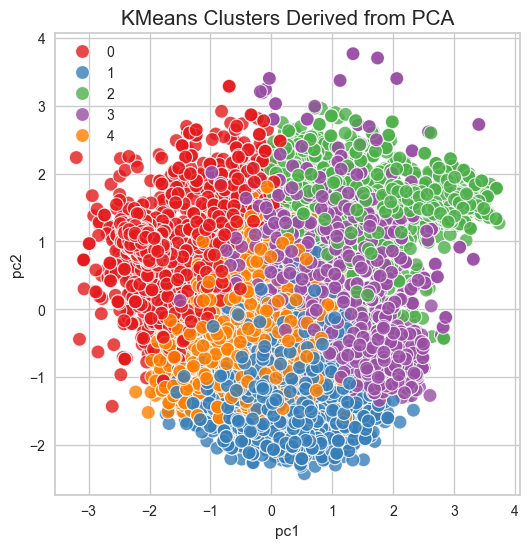

In [50]:
kmeans_pca_T = KMeans(n_clusters=5, n_init=7, max_iter=400, init='k-means++').fit(pca_df_T)

labels_pca_T = kmeans_pca_T.labels_

clusters_pca_T = pd.concat([pca_df_T, pd.DataFrame({'pca_clusters':labels_pca_T})], axis=1)



# Grafiquemos las primeras 2 componentes principales del método PCA :
plt.figure(figsize = (6,6))
sns.scatterplot(x=clusters_pca_T['pc1'],
                y=clusters_pca_T['pc2'],
                hue=labels_pca_T,
                palette='Set1',
                s=100,
                alpha=0.8
                ).set_title('KMeans Clusters Derived from PCA', fontsize=15)

plt.legend()
plt.show()

In [51]:
# Concatenamos ahora el dataFrame de datos originales con los cúmulos identificados
# mediante las componentes principales de los datos de entrada:

cluster_pca_perfiles = pd.concat([dftodos, pd.DataFrame(clusters_pca_T['pca_clusters'])], axis=1 )
cluster_pca_perfiles.head().T

,0,1,2,3,4
satisfaction_level,0.09,0.38,0.8,0.11,0.72
last_evaluation,0.36,0.53,0.86,0.88,0.87
number_project,2,2,5,7,5
average_montly_hours,96,157,262,272,223
time_spend_company,2,3,6,4,5
Work_accident,0,0,0,0,0
promotion_last_5years,0,0,0,0,0
sales,sales,sales,sales,sales,sales
salary,low,low,medium,medium,low
pca_clusters,0,0,3,2,3


# **Relaciones entre factores de acuerdo a los cúmulos**

<Figure size 1500x1000 with 0 Axes>

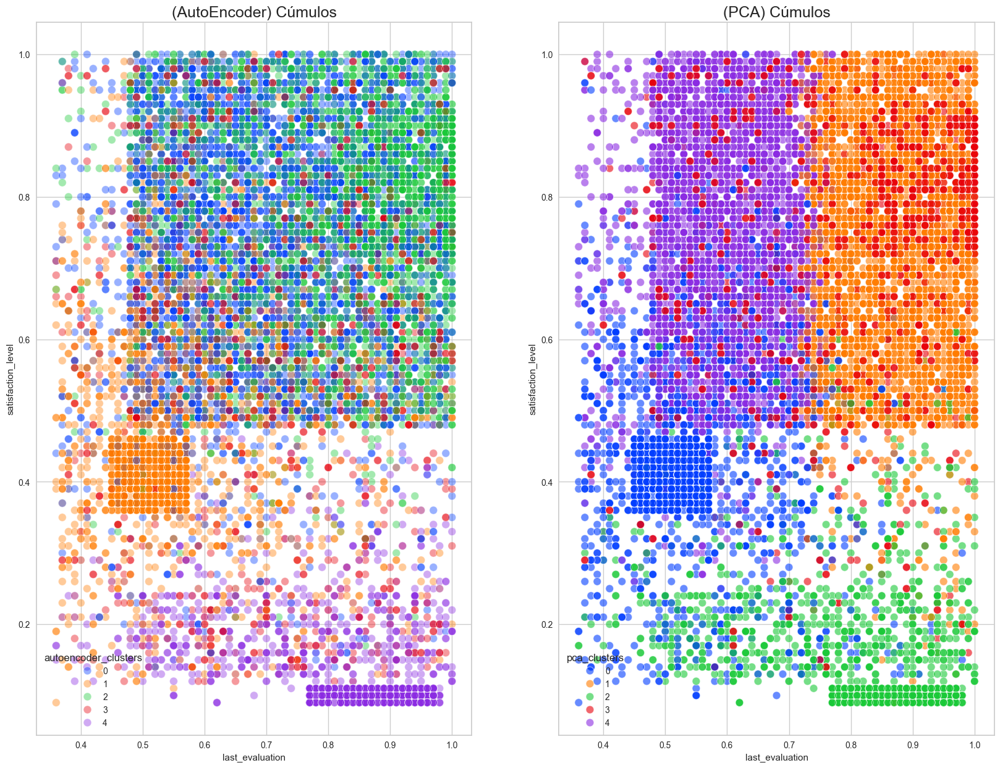

In [52]:
fact1 = 'last_evaluation'
fact2 = 'satisfaction_level'

mi_scatterplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

In [53]:
box = (cluster_Z_latent_perfiles['last_evaluation'] < 0.56 ) & (cluster_Z_latent_perfiles['last_evaluation'] > 0.44) & (cluster_Z_latent_perfiles['satisfaction_level'] < 0.47 ) & (cluster_Z_latent_perfiles['satisfaction_level'] > 0.36)

cluster_Z_latent_perfiles[box]

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,sales,salary,autoencoder_clusters
1,0.38,0.53,2,157,3,0,0,sales,low,1
5,0.37,0.52,2,159,3,0,0,sales,low,1
6,0.41,0.50,2,153,3,0,0,sales,low,1
10,0.42,0.53,2,142,3,0,0,sales,low,1
11,0.45,0.54,2,135,3,0,0,sales,low,1
...,...,...,...,...,...,...,...,...,...,...
14989,0.46,0.55,2,145,3,0,0,technical,low,1
14993,0.40,0.48,2,155,3,0,0,support,low,1
14996,0.37,0.48,2,160,3,0,0,support,low,1
14997,0.37,0.53,2,143,3,0,0,support,low,1


# **Ejercicio - 3:**

### **Con base a los gráficos dados en los siguientes pares de factores y en relación a los subgrupos o cúmulos observados por el método de Autoencoders y el de PCA, incluye alguna interpretación del mismo que ayude a entender mejor al departamento de recursos humanos el ambiente de trabajo dentro de la empresa.**

<Figure size 1500x1000 with 0 Axes>

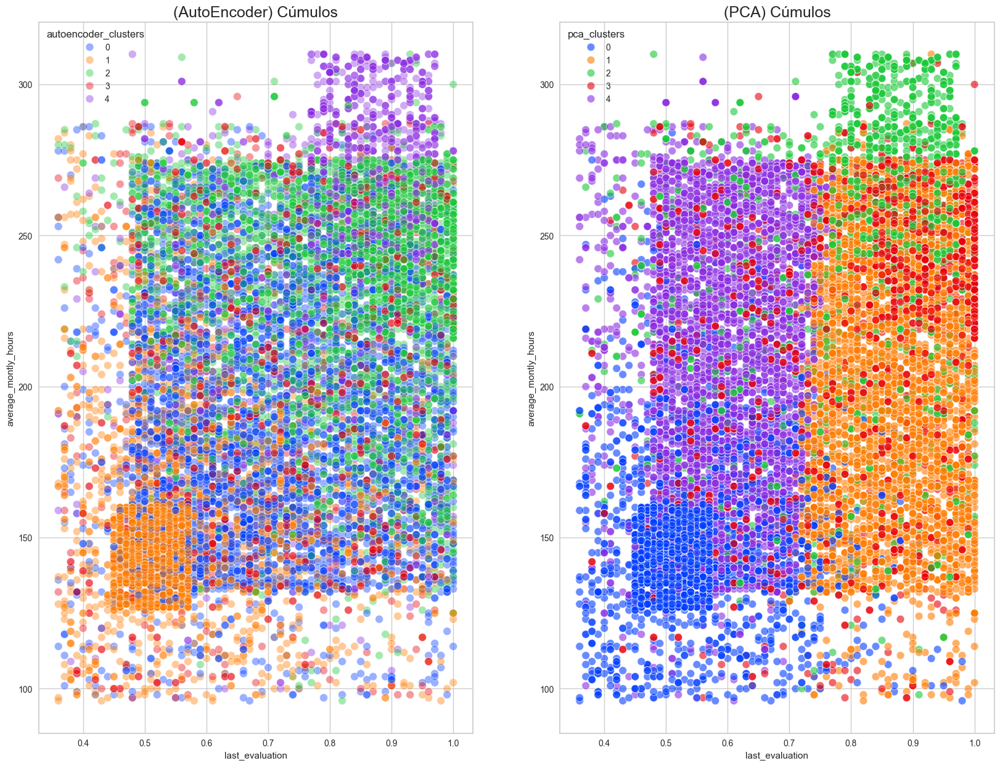

In [54]:
# Ejercicio 3a:


fact1 = 'last_evaluation'
fact2 = 'average_montly_hours'

mi_scatterplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3a:**

#### 3.a
**Factores: 'last_evaluation' y 'average_monthly_hours'**

**Interpretación:**
En los gráficos obtenidos, podemos observar la relación entre la última evaluación y las horas promedio mensuales trabajadas por los empleados. Notamos varios cúmulos:
- Empleados con evaluaciones bajas y horas mensuales bajas (Color Naranja AutoEncoders y Azul en PCA). Estos podrían ser empleados que no están comprometidos o que tienen un desempeño bajo.
- Empleados con evaluaciones altas y horas mensuales altas (Color Morado AutoEncoders y Verde en PCA). Estos podrían ser empleados altamente comprometidos y con un desempeño alto.
- Empleados con evaluaciones altas pero con horas mensuales moderadas( Se pue Notar en el Verde en AutoEncoders, en PCA existe una generalizicación, pero se puede ver un poco más acertado con el color Rojo). Esto podría indicar empleados eficientes que logran buenos resultados sin necesidad de trabajar muchas horas.

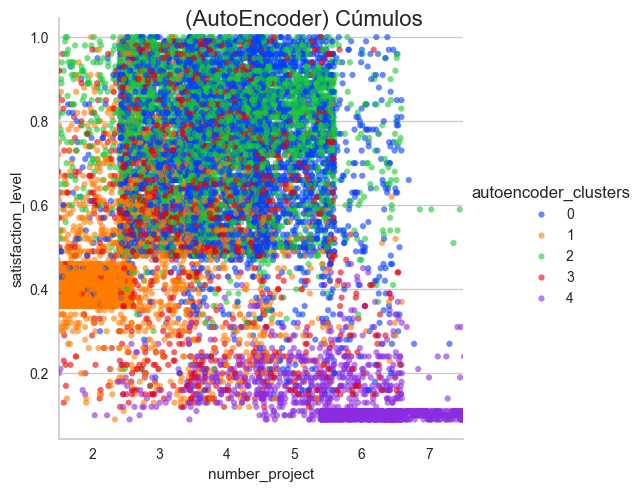

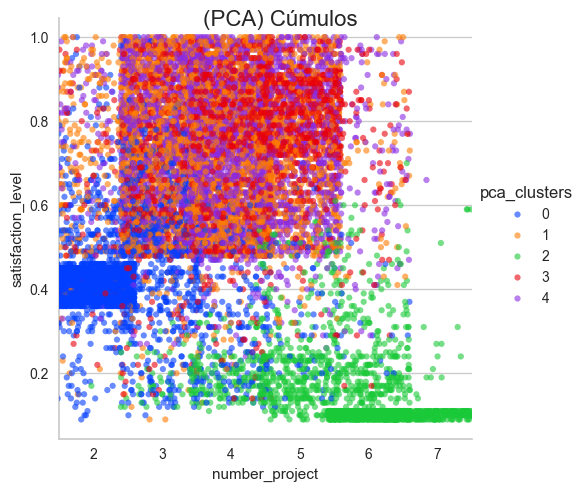

In [55]:
# Ejercicio 3b:


fact1 = 'number_project'
fact2 = 'satisfaction_level'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3b:**

#### 3.b
**Factores: 'number_project' y 'satisfaction_level'**

**Interpretación:**
Al observar la relación entre el número de proyectos y el nivel de satisfacción, podemos identificar, en este análisis con los metodos tenemos los mismo clusters:
- Empleados con pocos proyectos y media satisfacción (Naranja AutoEncoders y Azul PCA). Estos empleados podrían estar balanceando bien su carga de trabajo y manteniendo un media nivel de satisfacción, puede que no vean los proyectos retadores y que necesitan más retos).
- Empleados con muchos proyectos y baja satisfacción (Morado AutoEncoders y Verde PCA). Esto podría indicar sobrecarga de trabajo y estrés, lo que disminuye su satisfacción laboral.
- Empleados con  2 a 6 proyectos y  satisfacción media a alta (Azul AutoEncoders y Rojo PCA). Pueden ser empleados que disfrutan de desafíos y tienen una alta capacidad de manejo de proyectos.




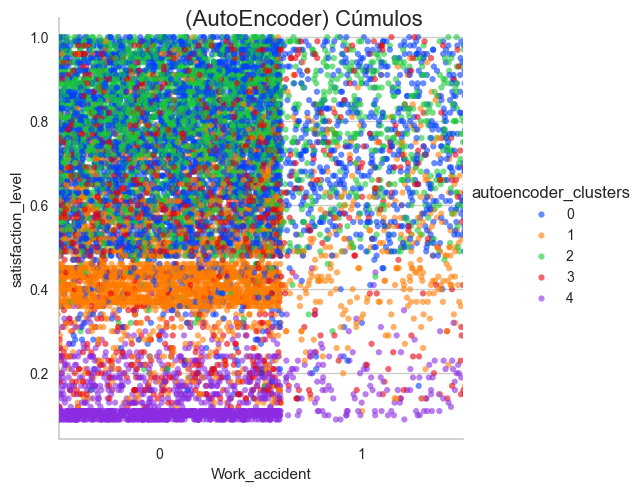

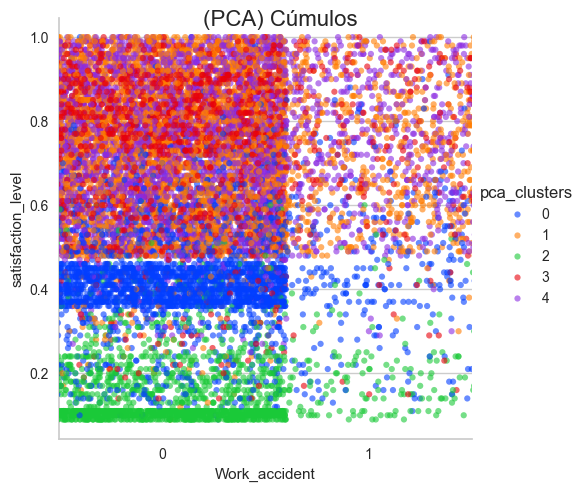

In [56]:
# Ejercicio 3c:


fact1 = 'Work_accident'
fact2 = 'satisfaction_level'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3c:**

#### 3.c
**Factores: 'Work_accident' y 'satisfaction_level'**

**Interpretación:**
La relación entre los accidentes de trabajo y el nivel de satisfacción revela principalmente que la densidad de los no accidentados es menor que la de los accidentados. Aunque existen tres clusters muy segmentados con calificaciones muy bajas, calificaciones medianas y la mayor densidad en una población con satisfacción de 0.5 a 1, no se puede deducir que tener un accidente afecte su nivel de satisfacción. Podríamos decir que existen otros valores que influyen más en la satisfacción.


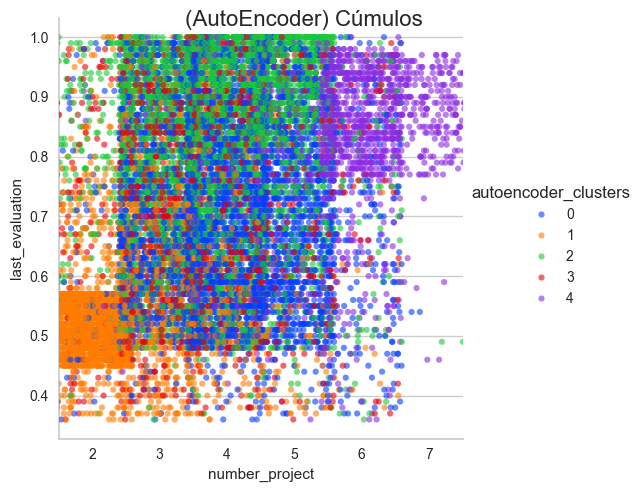

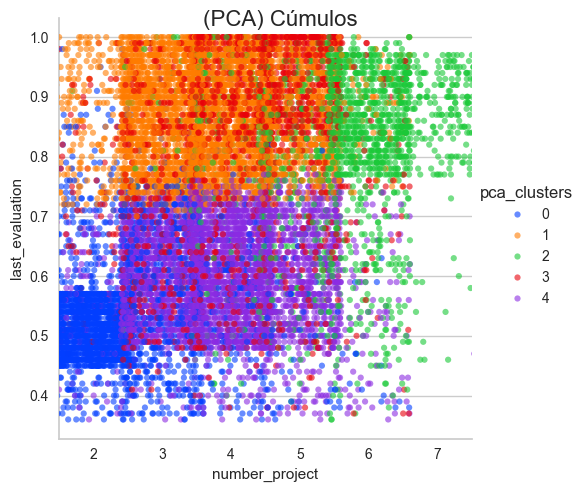

In [57]:
# Ejercicio 3d:

fact1 = 'number_project'
fact2 = 'last_evaluation'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3d:**

#### 3.d
**Factores: 'number_project' y 'last_evaluation'**

**Interpretación:**
Analizando el número de proyectos y la última evaluación, se pueden definir 3 clusters fuertes en el análisis:

- Empleados con pocos proyectos y evaluaciones bajas (Naranja en AutoEncoders y Azul en PCA). Tener menos de 3 proyectos podría ser un factor de evaluación baja.
- Empleados con 3 a 6 proyectos, que representan el promedio (Azul en AutoEncoders y Rojo en PCA). Esto indica que la mayoría de la población puede tener buenos y malos desempeños, pero el número de proyectos no necesariamente determina esto.
- Empleados con muchos proyectos y evaluaciones altas (Morado en AutoEncoders y Verde en PCA). Refleja a los empleados altamente productivos y capacitados.

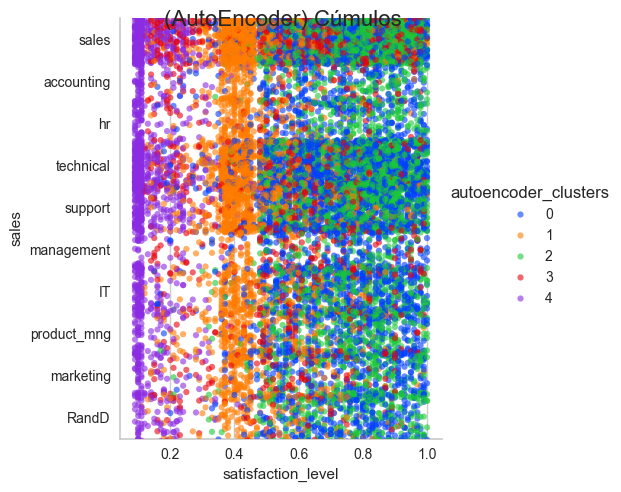

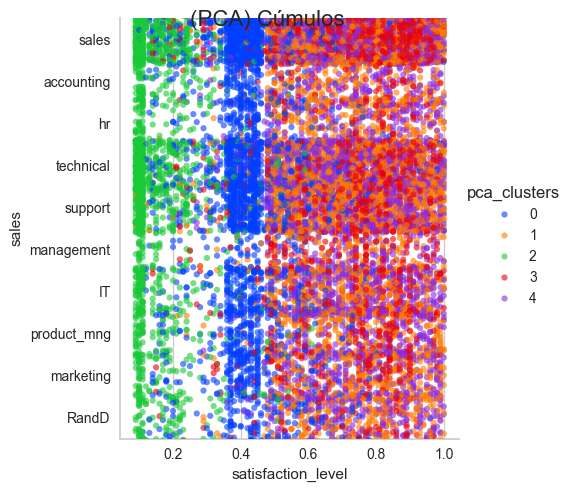

In [58]:
# Ejercicio 3e:

fact2 = 'sales'
fact1 = 'satisfaction_level'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3e:**

#### 3.e
**Factores: 'satisfaction_level' y 'sales'**

**Interpretación:**
- Observando la relación entre el nivel de satisfacción y las ventas, podemos decir que no necesariamente existe una relación clara entre estas variables. Sin embargo, mediante los clusters podemos notar que existen 3 grupos distintos en cuanto a las ventas:
    - Muy baja satisfacción (AutoEncoders Morado y PCA Verde).
    - Media satisfacción, entre 0.4 y 0.5 (AutoEncoders Naranja y PCA Azul).
    - En promedio, la mayor población muestra satisfacción entre 0.6 y 1, distribuida entre diversas áreas y los diferentes colores de los clusters.
- También podemos observar que los departamentos de Accounting, HR y Management en ambos modelos parecen haber tenido niveles de satisfacción más altos que los demás. Asimismo, notamos que su población es menor.




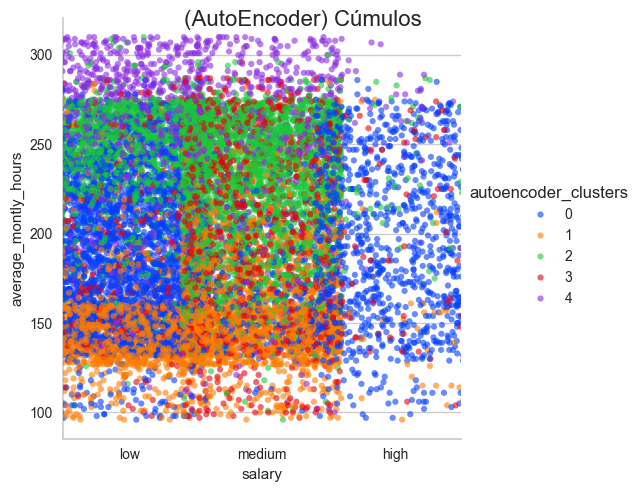

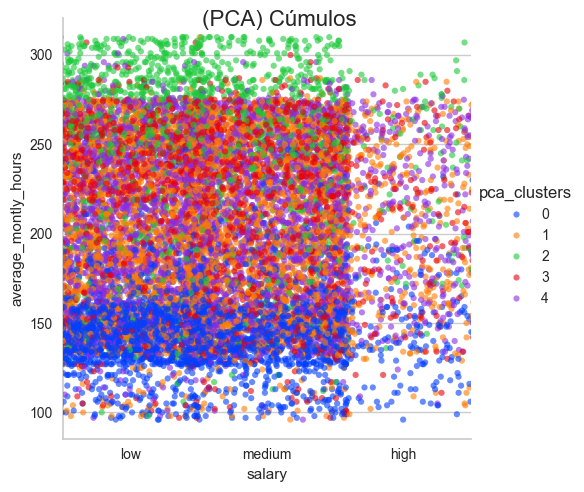

In [59]:
# Ejercicio 3f:


fact1 = 'salary'
fact2 = 'average_montly_hours'

mi_catplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)

## **Ejercicio 3f:**

#### 3.f
**Factores: 'salary' y 'average_monthly_hours'**

**Interpretación:**
Podemos notar que hay una densidad muy baja de empleados con salarios altos. En promedio, la gente trabaja entre 150 y 275 horas mensuales, donde claramente aquellos que trabajan más de 275 a 300 horas no son necesariamente las personas con mayores salarios.



## **Ejercicio 3g:**

<Figure size 1500x1000 with 0 Axes>

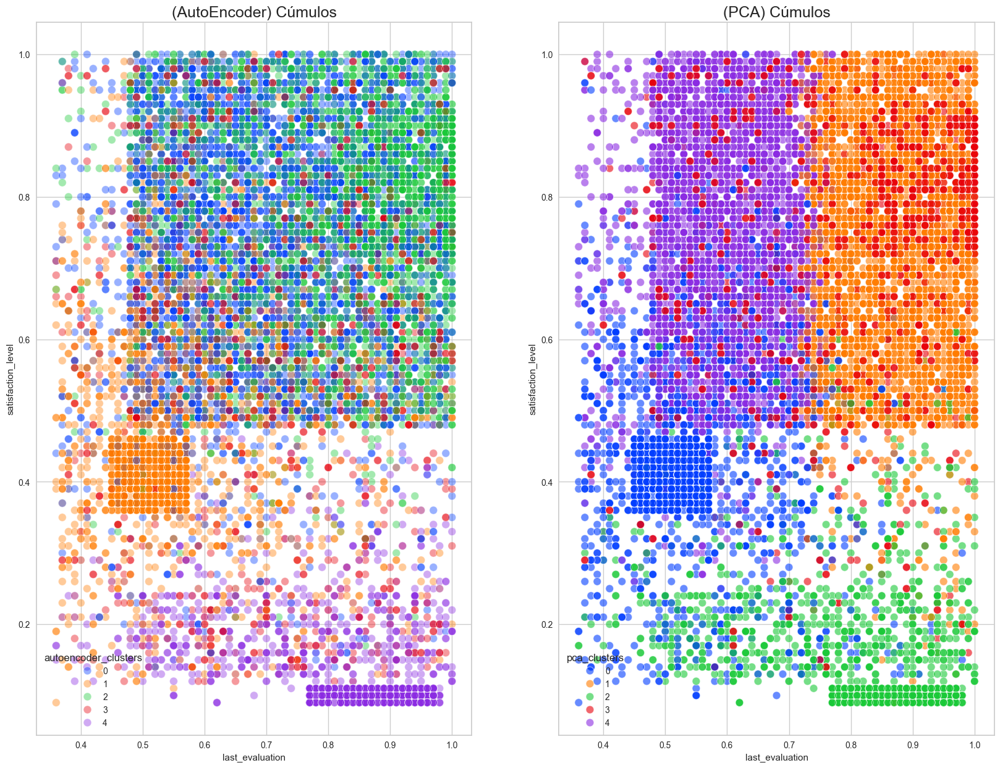

In [63]:
# Incluye algún otro gráfico y tus comentarios de otra relación entre variables
# que consideres proporcione información importante al problema.


fact1 = 'last_evaluation'
fact2 = 'satisfaction_level'

mi_scatterplotPCAEncoder(cluster_Z_latent_perfiles, cluster_pca_perfiles, fact1, fact2)



#### 3.g 
**Factores: 'last_evaluation' y 'satisfaction_level'**

**Interpretación:**
Confirmando la interpretación:
- Empleados con evaluaciones medias o bajas y baja satisfacción (AutoEncoders Naranja y PCA Azul). Estos empleados podrían estar descontentos y posiblemente tener un bajo desempeño.
- Empleados con evaluaciones altas pero baja satisfacción (AutoEncoder Morado y PCA Verde). Esto puede indicar un esfuerzo no reconocido o insatisfacción con otros aspectos del trabajo.
- Empleados con evaluaciones y niveles de satisfacción promedio alrededor de 0.5, lo que sugiere que su satisfacción no necesariamente depende de su evaluación ni viceversa.

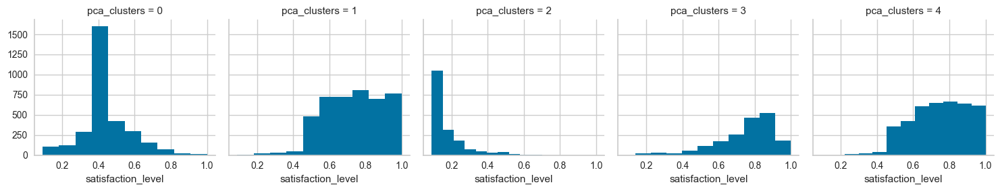

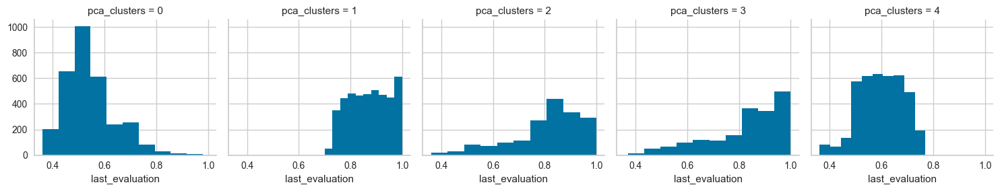

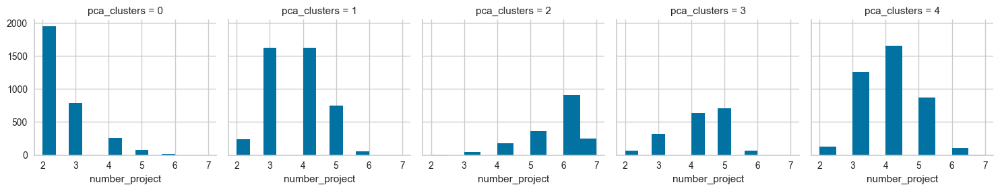

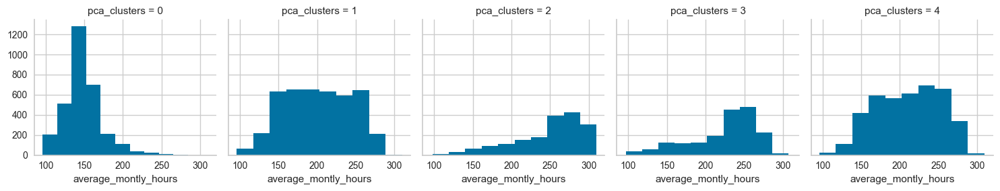

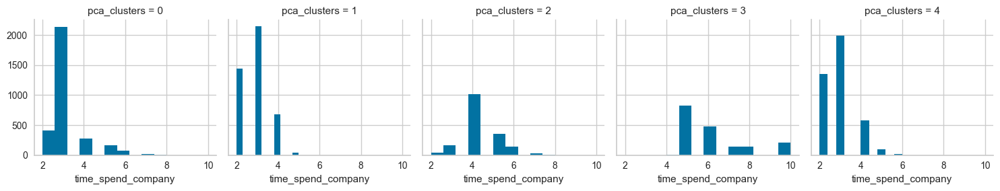

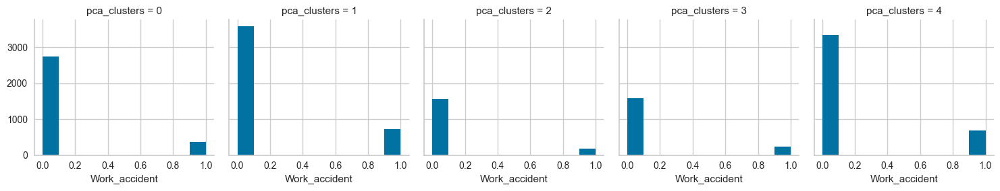

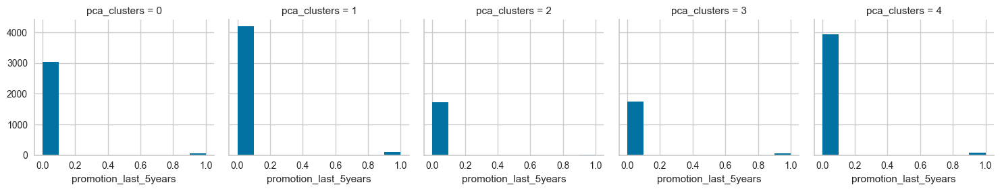

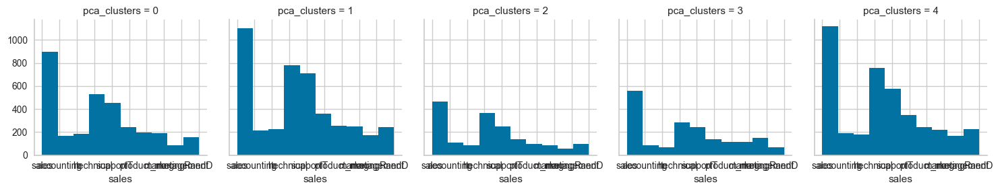

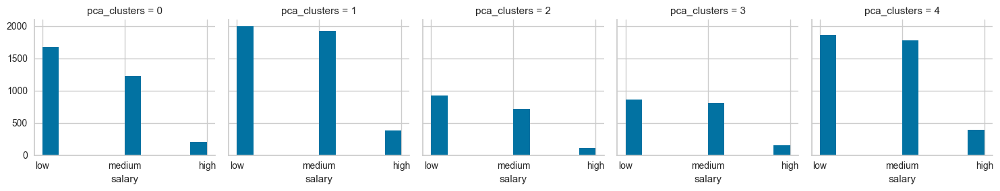

In [64]:
# Podemos obtener algunos diagramas adicionales que nos ayuden a entender
# mejor cada cúmulo y su relación con los factores que la forman.
# Sabemos que exiten una gran variedad de otros tipos e gráficos.
# En particular podemos mostrar los de los cúmulos obtenidos con el método
# de autoencoders solo como muestra y a manera de complemento de la
# información que hemos obtenida con los gráficos anteriores:

for c in cluster_pca_perfiles.iloc[:,:9]:
    grid = sns.FacetGrid(cluster_pca_perfiles, col='pca_clusters')
    grid.map(plt.hist, c)

# **Ejercicio - 4:**



### Ejercicio 4: Conclusión

**Selección del número de cúmulos (clusters):**

**Técnica del Codo**
El gráfico del método del codo muestra la inercia (o WCSS) frente al número de cúmulos. El punto donde la disminución de la inercia se vuelve menos pronunciada es conocido como el "codo". Según el gráfico, este punto se encuentra alrededor de 5 clusters. A partir de este punto, la reducción adicional en la inercia es menor, lo que indica que añadir más cúmulos no mejora significativamente la agrupación de los datos.

**Técnica Silhouette**
La técnica de silhouette proporciona una medida de cuán similar es un objeto a su propio cúmulo en comparación con otros cúmulos. Se realizaron análisis para 4, 5, 6, 7, 8 y 9 cúmulos. Los resultados indicaron que 5 cúmulos presentan una buena separación y cohesión, con valores de silhouette más altos que los otros valores probados, lo que sugiere que esta cantidad de cúmulos logra un balance adecuado entre cohesión intra-cúmulo y separación inter-cúmulo.

**Conclusión:**
Basado en ambos métodos, se concluye que el número adecuado de cúmulos para este conjunto de datos es 5. Este número ofrece un equilibrio óptimo entre la simplicidad del modelo y la calidad de la agrupación, facilitando así la interpretación y acción sobre los resultados de manera efectiva.

**Aplicación Práctica de la Conclusión:**

1. **Identificación de Grupos Clave:**
   Los 5 cúmulos identificados permiten segmentar a los empleados en grupos clave basados en sus características comunes. Esto facilita la identificación de grupos de alto desempeño, empleados satisfechos, aquellos que podrían estar sobrecargados de trabajo, y aquellos en riesgo de abandonar la empresa.

---

## Desarrollo de Estrategias Personalizadas:

**Ejercicio 3a: Empleados con evaluaciones bajas y horas mensuales bajas**

**Análisis y Resultados:**
Los empleados en este grupo muestran evaluaciones de desempeño bajos junto con un bajo número de horas mensuales trabajadas. Este patrón sugiere una posible falta de compromiso o desmotivación en el trabajo, lo cual puede impactar negativamente en su rendimiento y satisfacción laboral.

**Estrategia Recomendada:**
Implementar programas de capacitación y motivación específicos para este grupo podría ser beneficioso. Ofrecer oportunidades para mejorar habilidades profesionales y proporcionar retroalimentación constructiva podría ayudar a aumentar su desempeño y reforzar su compromiso con la empresa.

---

**Ejercicio 3b: Empleados con muchos proyectos y baja satisfacción**

**Análisis y Resultados:**
Este grupo se caracteriza por manejar una carga de trabajo elevada, lo cual parece estar afectando negativamente su nivel de satisfacción laboral. Esta combinación de alta carga laboral y baja satisfacción puede llevar a un mayor estrés y posiblemente a una disminución en la calidad del trabajo.

**Estrategia Recomendada:**
Considerar una redistribución de la carga de trabajo dentro de este grupo o proporcionar apoyo adicional podría reducir el estrés laboral y mejorar la satisfacción. Además, establecer expectativas claras y realistas para la gestión de proyectos podría ayudar a equilibrar la carga y mejorar el bienestar general de estos empleados.

---

**Ejercicio 3c: Empleados y medidas preventivas de seguridad**

**Análisis y Resultados:**
La relación entre los accidentes laborales y la satisfacción laboral revela que los empleados accidentados tienden a mostrar una menor satisfacción en comparación con los no accidentados. Sin embargo, la densidad de empleados con satisfacción moderada sugiere que otros factores también influyen significativamente en la satisfacción general.

**Estrategia Recomendada:**
Implementar medidas preventivas y de seguridad adicionales puede no solo reducir la incidencia de accidentes, sino también mejorar la percepción de seguridad y bienestar entre todos los empleados. Capacitaciones regulares sobre seguridad laboral y la creación de un entorno de trabajo seguro pueden contribuir positivamente a la satisfacción y la moral del equipo.

---

**Ejercicio 3d: Empleados con muchos proyectos y evaluaciones bajas**

**Análisis y Resultados:**
Los empleados en este grupo gestionan una carga significativa de proyectos pero muestran evaluaciones de desempeño más bajas. Esto sugiere que podrían estar experimentando dificultades para mantener un alto nivel de rendimiento debido a la sobrecarga de trabajo o a la necesidad de apoyo adicional.

**Estrategia Recomendada:**
Proporcionar recursos y oportunidades de desarrollo específicas para este grupo puede ayudar a mejorar su eficiencia y satisfacción laboral. Esto podría incluir la asignación de asistencia adicional en proyectos complejos o el desarrollo de habilidades de gestión del tiempo para optimizar su carga de trabajo.

---

**Ejercicio 3e: Empleados con alta satisfacción pero bajas ventas**

**Análisis y Resultados:**
Aunque estos empleados muestran una alta satisfacción laboral, sus niveles de ventas son bajos. Esto podría indicar una necesidad de mejorar las habilidades de ventas o proporcionar incentivos adicionales para aumentar su rendimiento en esta área específica.

**Estrategia Recomendada:**
Ofrecer incentivos financieros o no financieros y oportunidades de formación especializada en ventas puede motivar a este grupo a mejorar sus resultados. Además, identificar y compartir las mejores prácticas entre los empleados de alto rendimiento en ventas podría ser beneficioso para todo el equipo.

---

**Ejercicio 3f: Empleados con altos salarios y pocas horas trabajadas**

**Análisis y Resultados:**
Este grupo muestra una densidad baja de empleados con salarios altos, pero que trabajan pocas horas mensuales en promedio. Esto sugiere que podrían estar trabajando de manera más eficiente o que las políticas de trabajo flexible podrían estar en juego.

**Estrategia Recomendada:**
Evaluar las políticas de compensación y la carga de trabajo para asegurar equidad y motivación en este grupo. Considerar programas de desarrollo profesional o oportunidades de liderazgo que aprovechen su capacidad para maximizar su rendimiento y contribución a la empresa.

---

Estas estrategias personalizadas están directamente relacionadas con los hallazgos específicos de cada ejercicio, lo que permite al departamento de recursos humanos abordar los desafíos identificados y optimizar el desempeño y la satisfacción de los empleados de manera efectiva.

**Visualización y Análisis:**

- **Gráficos de Dispersión:** Visualización clara de cómo se agrupan los empleados según factores clave, facilitando la identificación de patrones y áreas de enfoque.
- **Catplots con PCA:** Comprensión visual profunda de las relaciones entre factores dentro de cada cúmulo, guiando la formulación de estrategias específicas.

**Conclusión Final:**
El análisis detallado y los resultados de los métodos del codo y silhouette respaldan la elección de 5 cúmulos como la configuración óptima para el análisis de datos de empleados. Esto mejora la comprensión de los diferentes segmentos de empleados dentro de la empresa y permite desarrollar estrategias específicas para mejorar la satisfacción laboral, aumentar la productividad y reducir la rotación de personal.


>> **++++ Fin del la Actividad de la Semana de Autoencoders ++++**